# Cluster Analysis on Spotify Song Attributes
### Are we able to infer Genres of different songs based on their attributes?

https://www.kaggle.com/datasets/geomack/spotifyclassification

In [ ]:
# flake8: noqa: F401, E402

%load_ext autoreload
%autoreload 2
# %load_ext jupyter_black

### Import necessary libraries

In [21]:
# Import necessary libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from IPython.display import display
from joblib import Memory
from scipy.cluster.hierarchy import dendrogram, linkage
import warnings
import seaborn as sns
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from sklearn.metrics import davies_bouldin_score


memory = Memory(location="./cache_dir", verbose=0)

from lib import (
    visualize_clusters_2d,
    visualize_clusters_3d,
    visualize_pca_2d,
    visualize_pca_3d,
    elbow_method,
    silhouette_plot,
    plot_dendrogram,
    plot_clusters_vs_linkage_distance,
    plot_clusters_vs_silhouette_score,
)

### Load and Preview Data

In [3]:
# Load Data
df = pd.read_csv("data/spotify_song_data.csv")
display(df.head())
display(df.describe())

,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys


,Unnamed: 0,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target
count,2017.000000,2017.000000,2017.000000,2.017000e+03,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000
mean,1008.000000,0.187590,0.618422,2.463062e+05,0.681577,0.133286,5.342588,0.190844,-7.085624,0.612295,0.092664,121.603272,3.968270,0.496815,0.505702
std,582.402066,0.259989,0.161029,8.198181e+04,0.210273,0.273162,3.648240,0.155453,3.761684,0.487347,0.089931,26.685604,0.255853,0.247195,0.500091
min,0.000000,0.000003,0.122000,1.604200e+04,0.014800,0.000000,0.000000,0.018800,-33.097000,0.000000,0.023100,47.859000,1.000000,0.034800,0.000000
25%,504.000000,0.009630,0.514000,2.000150e+05,0.563000,0.000000,2.000000,0.092300,-8.394000,0.000000,0.037500,100.189000,4.000000,0.295000,0.000000
50%,1008.000000,0.063300,0.631000,2.292610e+05,0.715000,0.000076,6.000000,0.127000,-6.248000,1.000000,0.054900,121.427000,4.000000,0.492000,1.000000
75%,1512.000000,0.265000,0.738000,2.703330e+05,0.846000,0.054000,9.000000,0.247000,-4.746000,1.000000,0.108000,137.849000,4.000000,0.691000,1.000000
max,2016.000000,0.995000,0.984000,1.004627e+06,0.998000,0.976000,11.000000,0.969000,-0.307000,1.000000,0.816000,219.331000,5.000000,0.992000,1.000000


### Clean Data Part 1

In [4]:
# Drop column: 'Unnamed: 0'
df_cleaned = df.drop(columns=["Unnamed: 0"])
## Drop column: 'target'
df_cleaned = df_cleaned.drop(columns=["target"])
# Convert 'time_signature' column to categorical
df_cleaned["time_signature"] = df_cleaned["time_signature"].astype("category")
# Convert 'key' column to categorical
df_cleaned["key"] = df_cleaned["key"].astype("category")
# Drop column: 'song_title'
df_cleaned = df_cleaned.drop(columns=["song_title"])
# Drop column: 'artist'
df_cleaned = df_cleaned.drop(columns=["artist"])
# Drop column: 'mode'
df_cleaned = df_cleaned.drop(columns=["mode"])
# One-hot encode 'time_signature' and 'key', convert to 0.0/1.0
df_cleaned = pd.get_dummies(
    df_cleaned, columns=["time_signature", "key"], dtype=float
)

display(df_cleaned.head())

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,...,key_2,key_3,key_4,key_5,key_6,key_7,key_8,key_9,key_10,key_11
0,0.0102,0.833,204600,0.434,0.021900,0.1650,-8.795,0.4310,150.062,0.286,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.1990,0.743,326933,0.359,0.006110,0.1370,-10.401,0.0794,160.083,0.588,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0344,0.838,185707,0.412,0.000234,0.1590,-7.148,0.2890,75.044,0.173,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.6040,0.494,199413,0.338,0.510000,0.0922,-15.236,0.0261,86.468,0.230,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.1800,0.678,392893,0.561,0.512000,0.4390,-11.648,0.0694,174.004,0.904,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


### Clean Data Part 2

Remove outliers by checking if any column falls outside of 1.5 x IQR.

In [5]:
# Unused: Would remove nearly 75% of data, and the data is already clean

# # Remove rows with values outside IQR for all columns
# removal_indices = []
# for column in ['acousticness', 'danceability', 'duration_ms', 'energy',
#                 'instrumentalness', 'liveness', 'loudness', 'speechiness',
#                 'tempo', 'valence']:
#     Q1 = df_cleaned[column].quantile(0.25)
#     Q3 = df_cleaned[column].quantile(0.75)
#     IQR = Q3 - Q1

#     removal_indices.extend(
#         df_cleaned[
#             (df_cleaned[column] < Q1 - 1.5 * IQR)
#             | (df_cleaned[column] > Q3 + 1.5 * IQR)
#         ].index.tolist()
#     )

# df_cleaned_outliers = df_cleaned.iloc[removal_indices]

# print("Outliers removed ({0}/{1}): ".format(len(df_cleaned_outliers), len(df_cleaned)))
# display(df_cleaned_outliers.head())
# df_cleaned_inliers = df_cleaned.drop(index=removal_indices)
# df_cleaned_inliers.head()

### Standardize the Data

In [6]:
# Standardize the Data

scaler = StandardScaler()
df_scaled = pd.DataFrame(
    scaler.fit_transform(df_cleaned), columns=df_cleaned.columns
)

# Display the first few rows of the scaled DataFrame
display(df_scaled.head())

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,...,key_2,key_3,key_4,key_5,key_6,key_7,key_8,key_9,key_10,key_11
0,-0.682467,1.332874,-0.508851,-1.177700,-0.407864,-0.166291,-0.454530,3.763084,1.066709,-0.853039,...,3.156257,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665
1,0.043897,0.773830,0.983716,-1.534468,-0.465683,-0.346454,-0.881573,-0.147529,1.442323,0.368970,...,-0.316831,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665
2,-0.589363,1.363932,-0.739362,-1.282352,-0.487200,-0.204897,-0.016586,2.183712,-1.745166,-1.310280,...,3.156257,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665
3,1.602040,-0.772860,-0.572137,-1.634363,1.379429,-0.634715,-2.167220,-0.740350,-1.316964,-1.079636,...,-0.316831,-0.179559,-0.234342,3.339252,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665
4,-0.029201,0.370075,1.788484,-0.573574,1.386753,1.596735,-1.213155,-0.258753,1.964120,1.647627,...,-0.316831,-0.179559,-0.234342,3.339252,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665


### Visualize Clusters Preemptively using PCA plot and pair plots

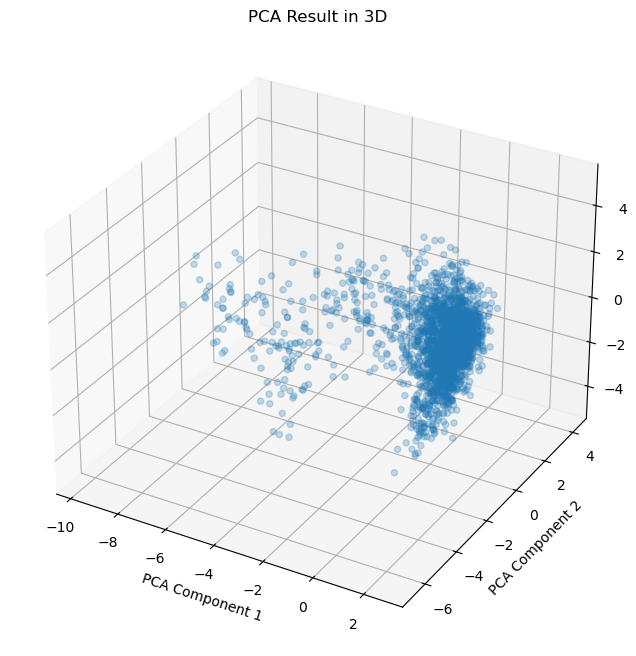

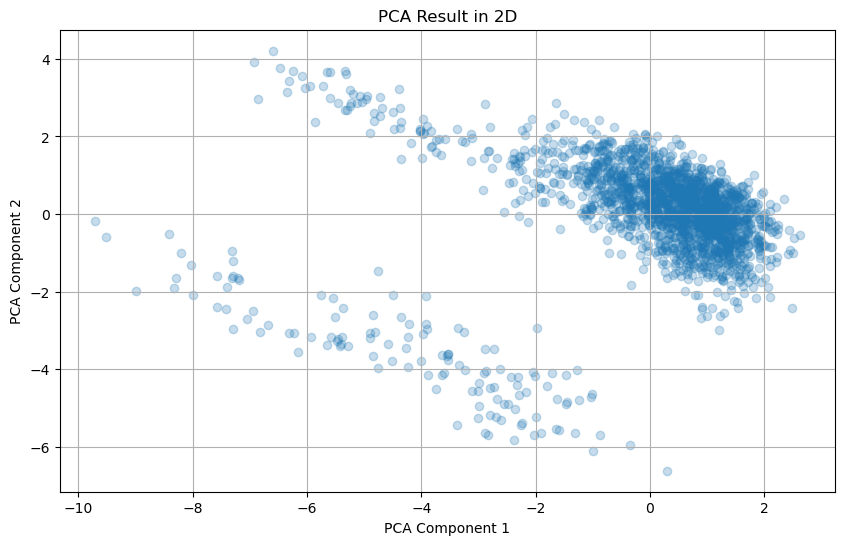

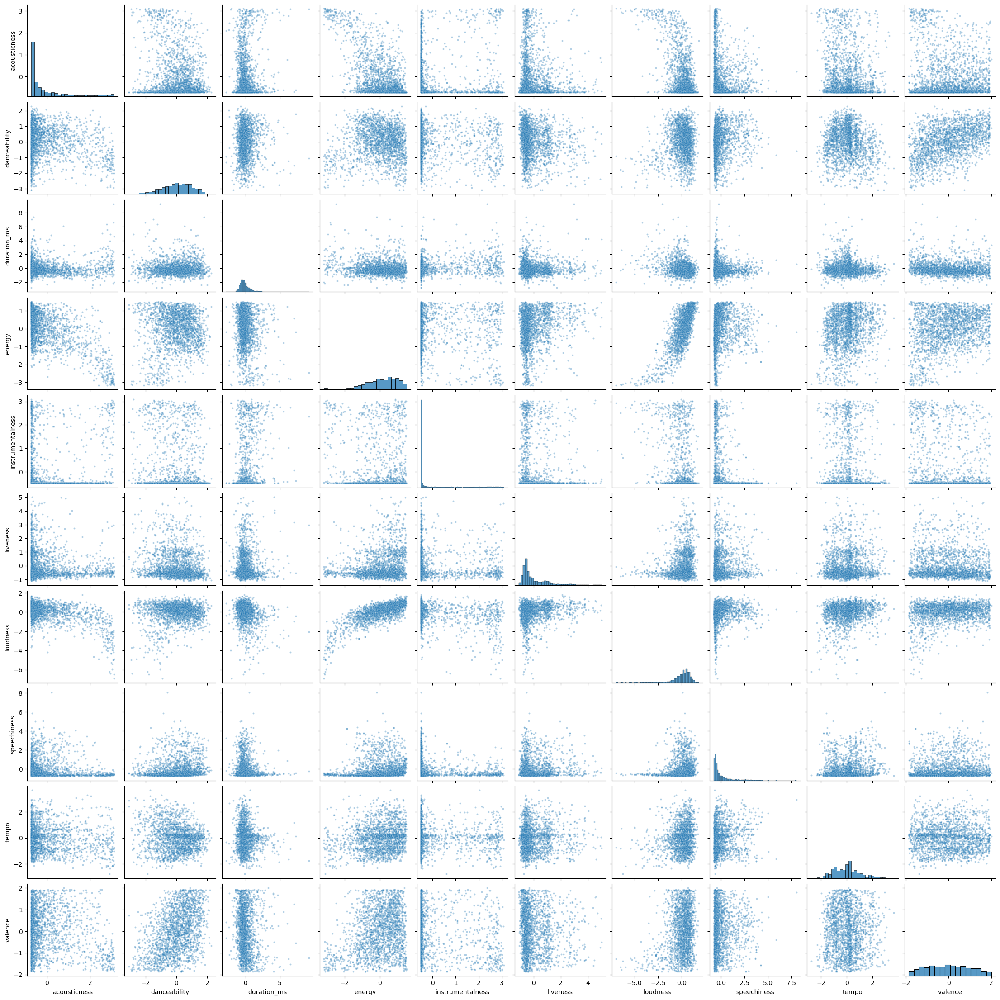

In [26]:
# Visualize PCA in with outliers in a different color
# PCA is fitted on both inliers and outliers (because it is for visualization purposes)
visualize_pca_3d(df_scaled)
visualize_pca_2d(df_scaled)


# Pairplots of all the data
# Inliers and outliers are plotted in different colors

# Only pairplot for columns that don't start with 'time_signature_' or 'key_'
df_pairplot = df_scaled.loc[
    :, ~df_scaled.columns.str.startswith(("time_signature_", "key_"))
]
sns.pairplot(
    df_pairplot,
    plot_kws={"s": 8, "alpha": 0.35},
    height=2.25,
)

From now on, we ignore the outliers and focus our efforts on the inliers.

### Clustering Algorithm 1: K-Means

#### Manual Review of Elbow Method and Silhouette Score Plot

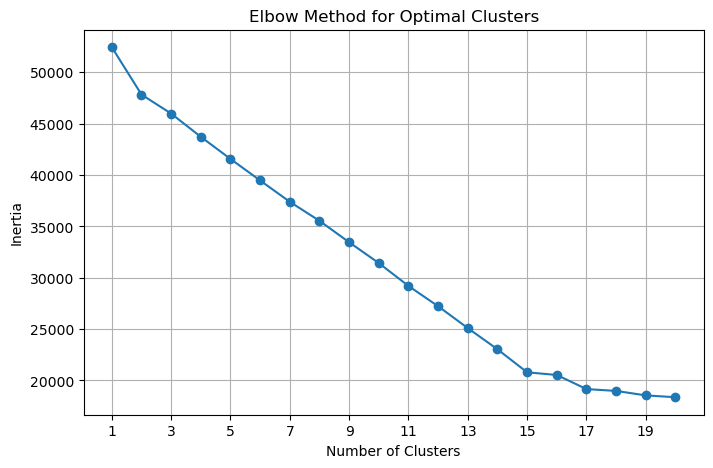

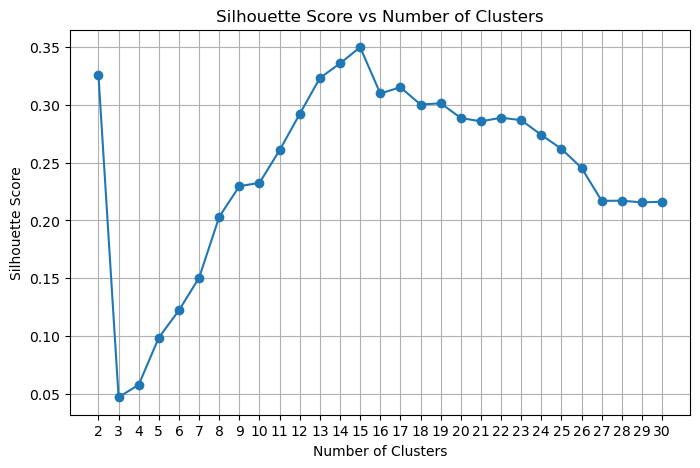

In [8]:
# Clustering Algorithm Type 1: K-Means

from sklearn.cluster import KMeans


def kmeans_clustering(df_scaled, n_clusters=3):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    df_kmeans = df_scaled.copy()
    df_kmeans["Cluster"] = kmeans.fit_predict(df_kmeans)

    # Display the first few rows of the DataFrame with cluster labels
    display(df_kmeans.head())

    return df_kmeans


# Use elbow method to determine the optimal number of clusters

import matplotlib.pyplot as plt

estimator = KMeans(n_clusters=0, random_state=42)
elbow_method(df_scaled, estimator, max_clusters=20)
plot_clusters_vs_silhouette_score(df_scaled, estimator, max_clusters=30)

The optimal cluster count according to both the elbow method and the silhouette score plot appears to be 15.

#### Performing and Visualization of KMeans Clustering

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,...,key_3,key_4,key_5,key_6,key_7,key_8,key_9,key_10,key_11,Cluster
0,-0.682467,1.332874,-0.508851,-1.177700,-0.407864,-0.166291,-0.454530,3.763084,1.066709,-0.853039,...,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,3
1,0.043897,0.773830,0.983716,-1.534468,-0.465683,-0.346454,-0.881573,-0.147529,1.442323,0.368970,...,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,12
2,-0.589363,1.363932,-0.739362,-1.282352,-0.487200,-0.204897,-0.016586,2.183712,-1.745166,-1.310280,...,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,3
3,1.602040,-0.772860,-0.572137,-1.634363,1.379429,-0.634715,-2.167220,-0.740350,-1.316964,-1.079636,...,-0.179559,-0.234342,3.339252,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,10
4,-0.029201,0.370075,1.788484,-0.573574,1.386753,1.596735,-1.213155,-0.258753,1.964120,1.647627,...,-0.179559,-0.234342,3.339252,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,10


K-Means Clustering Result:


,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,...,key_3,key_4,key_5,key_6,key_7,key_8,key_9,key_10,key_11,Cluster
0,-0.682467,1.332874,-0.508851,-1.177700,-0.407864,-0.166291,-0.454530,3.763084,1.066709,-0.853039,...,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,3
1,0.043897,0.773830,0.983716,-1.534468,-0.465683,-0.346454,-0.881573,-0.147529,1.442323,0.368970,...,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,12
2,-0.589363,1.363932,-0.739362,-1.282352,-0.487200,-0.204897,-0.016586,2.183712,-1.745166,-1.310280,...,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,3
3,1.602040,-0.772860,-0.572137,-1.634363,1.379429,-0.634715,-2.167220,-0.740350,-1.316964,-1.079636,...,-0.179559,-0.234342,3.339252,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,10
4,-0.029201,0.370075,1.788484,-0.573574,1.386753,1.596735,-1.213155,-0.258753,1.964120,1.647627,...,-0.179559,-0.234342,3.339252,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,10


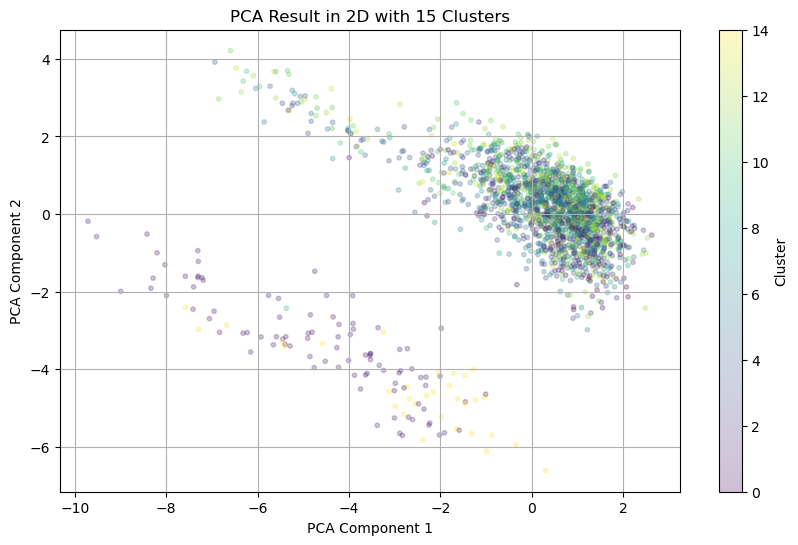

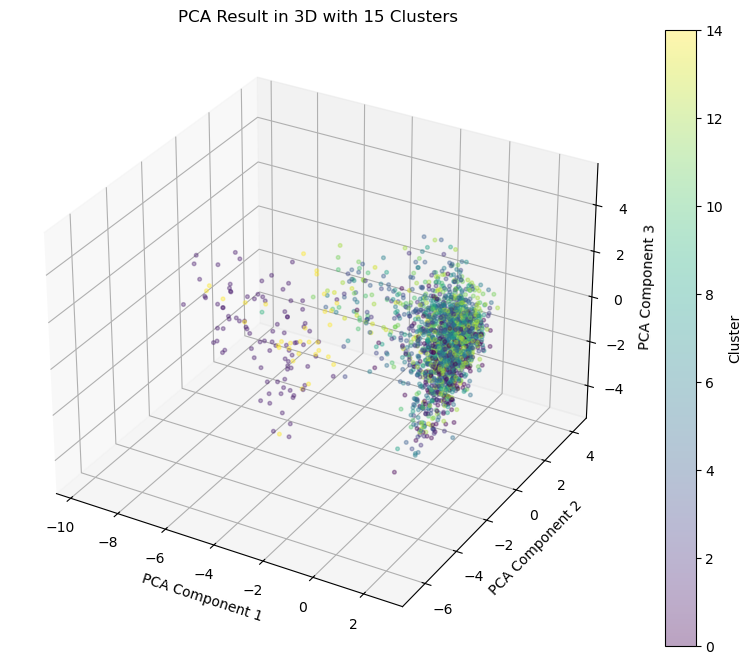

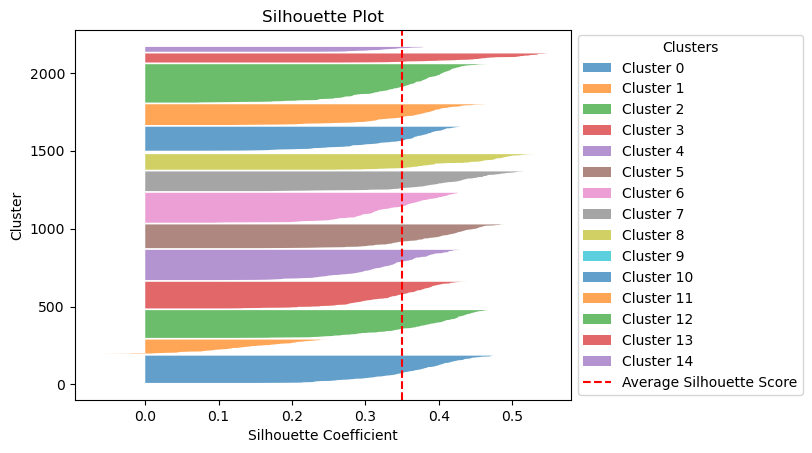

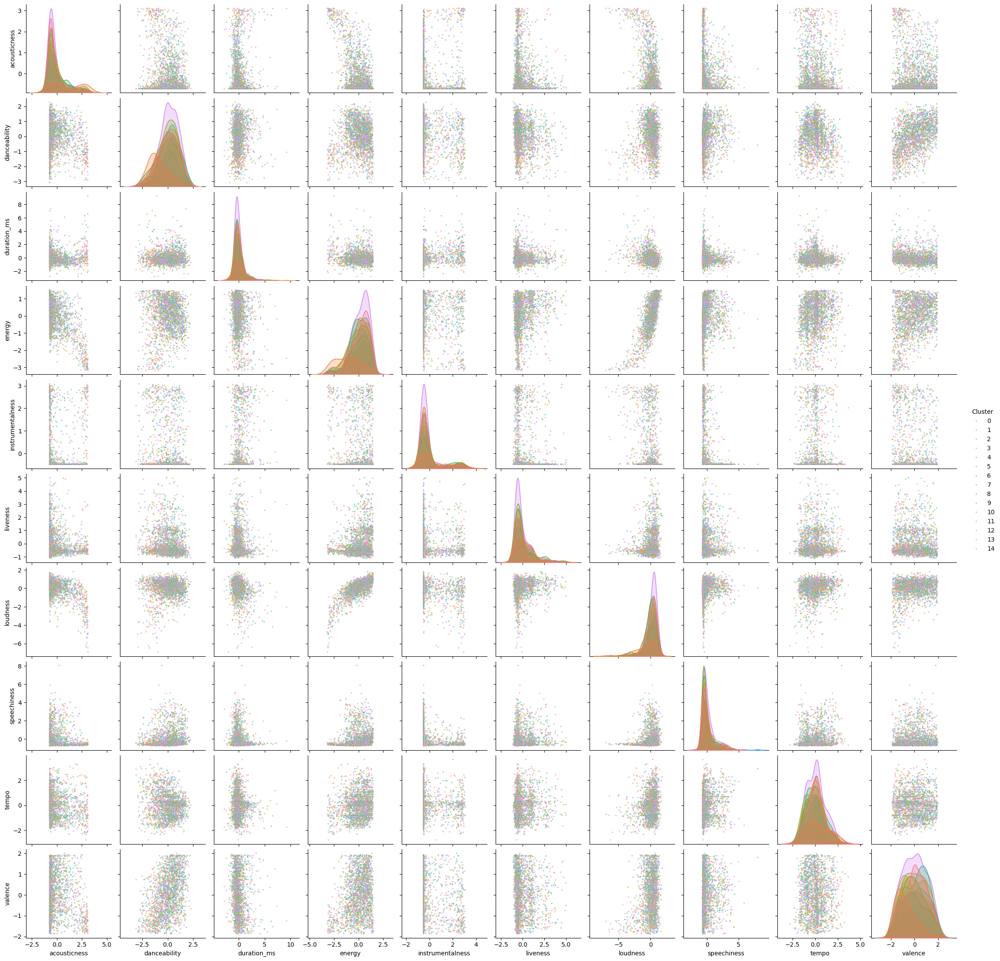

In [27]:
clusters = 15
df_kmeans = kmeans_clustering(df_scaled, n_clusters=clusters)

print("K-Means Clustering Result:")
display(df_kmeans.head())


# Display clusters in two colors on PCA plots
visualize_clusters_2d(df_kmeans, clusters, smaller_points=True)
visualize_clusters_3d(df_kmeans, clusters, smaller_points=True)

# Silhouette Plot

silhouette_plot(
    df_scaled,
    clusters,
    estimator=KMeans(n_clusters=clusters, random_state=42),
    legend_fix=True,
)

# Pairplots of K-Means clusters
# Only pairplot for columns that don't start with 'time_signature_' or 'key_'
df_kmeans_pairplot = df_kmeans.loc[
    :, ~df_kmeans.columns.str.startswith(("time_signature_", "key_"))
]
sns.pairplot(
    df_kmeans_pairplot,
    hue="Cluster",
    palette=sns.color_palette("husl", n_colors=clusters),
    plot_kws={"s": 6, "alpha": 0.5},
    height=2.25,
)

#### Silhouette and DBI Score for KMeans Clustering

In [14]:
# Silhouette Score for Hierarchical Clustering
silhouette_avg = silhouette_score(df_scaled, df_kmeans["Cluster"])
print(
    f"Silhouette Score for Hierarchical Clustering: {round(silhouette_avg, 4)}"
)

# Davies-Bouldin Index for K-Means Clustering
db_index = davies_bouldin_score(df_scaled, df_kmeans["Cluster"])
print(f"Davies-Bouldin Index for K-Means Clustering: {round(db_index, 4)}")

Silhouette Score for Hierarchical Clustering: 0.3497
Davies-Bouldin Index for K-Means Clustering: 1.0859


Surprisingly with the low sample sie in this set and the dubious feasibility that this would be sufficient information to separate genres, these clusters are not terrible! The DBI score is a mediocre and the silhouette score is not great, but they could be much worse.

### Clustering Algorithm 2: Hierarchical Clustering

#### Manual Review of Linkage-Clusters Plot "Elbow Method" and Silhouette Score Plot

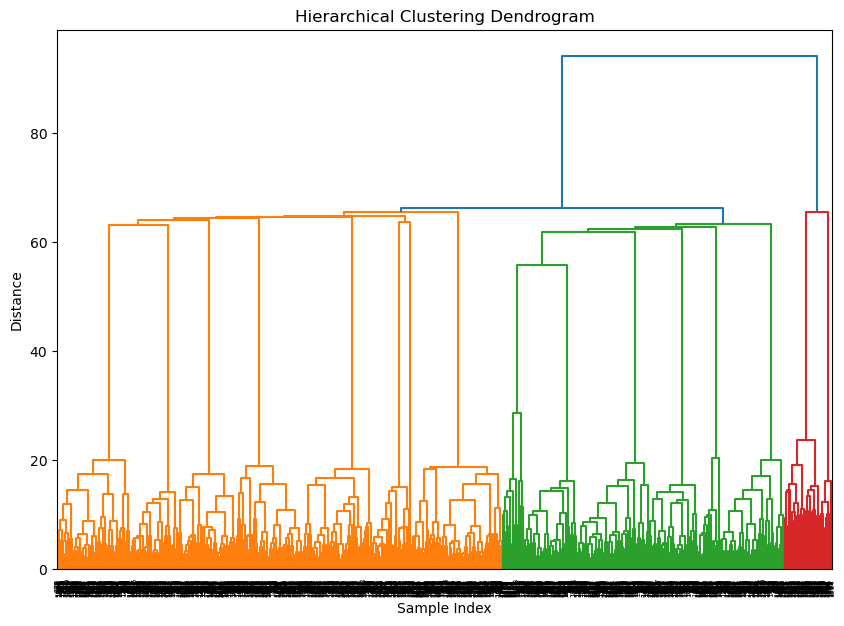

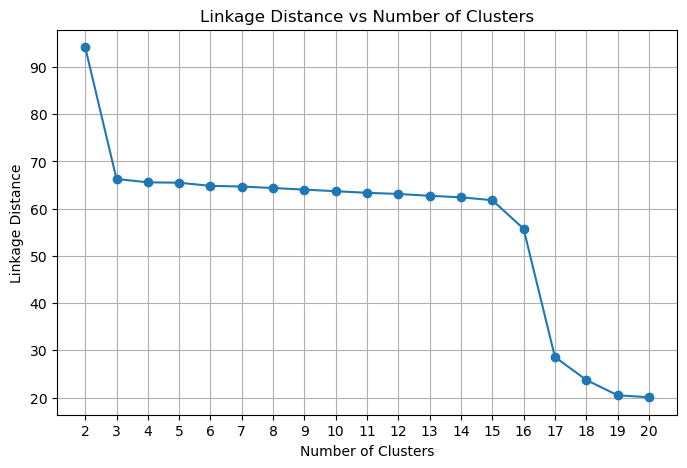

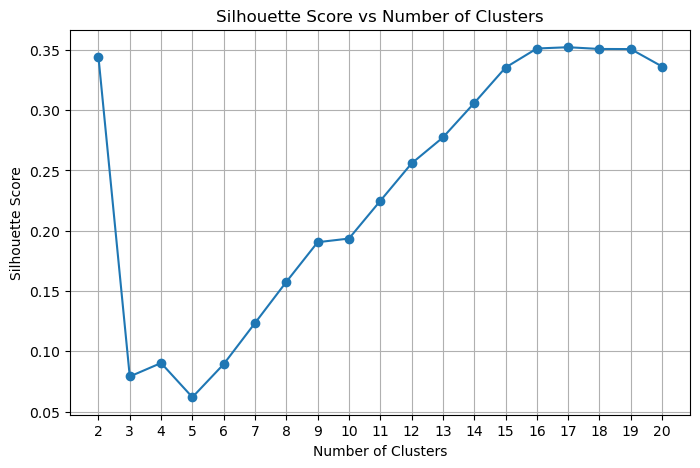

In [15]:
# Cluster using Hiearchical Clustering
from sklearn.cluster import AgglomerativeClustering


def hierarchical_clustering(df_scaled, n_clusters=3):
    # Fit Agglomerative Clustering
    agglo = AgglomerativeClustering(n_clusters=n_clusters)
    df_hierarchical = df_scaled.copy()
    df_hierarchical["Cluster"] = agglo.fit_predict(df_hierarchical)

    # Display the first few rows of the DataFrame with cluster labels
    display(df_hierarchical.head())

    return df_hierarchical


linked = linkage(df_scaled, method="ward")

# Plot dendrogram to visualize the hierarchical clustering
plot_dendrogram(df_scaled, linked)

# Plot clusters vs linkage distance
plot_clusters_vs_linkage_distance(df_scaled, linked, max_clusters=20)

plot_clusters_vs_silhouette_score(
    df_scaled,
    AgglomerativeClustering(n_clusters=0),
    max_clusters=20,
)

In the case of agglomerative ward-linked clustering, it looks like the optimal count is 17, supported by both the clusters v linkage distance plot and the silhouette score plot.

#### Performing and Visualizing Hierarchical Clustering

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,...,key_3,key_4,key_5,key_6,key_7,key_8,key_9,key_10,key_11,Cluster
0,-0.682467,1.332874,-0.508851,-1.177700,-0.407864,-0.166291,-0.454530,3.763084,1.066709,-0.853039,...,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,1
1,0.043897,0.773830,0.983716,-1.534468,-0.465683,-0.346454,-0.881573,-0.147529,1.442323,0.368970,...,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,4
2,-0.589363,1.363932,-0.739362,-1.282352,-0.487200,-0.204897,-0.016586,2.183712,-1.745166,-1.310280,...,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,1
3,1.602040,-0.772860,-0.572137,-1.634363,1.379429,-0.634715,-2.167220,-0.740350,-1.316964,-1.079636,...,-0.179559,-0.234342,3.339252,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,10
4,-0.029201,0.370075,1.788484,-0.573574,1.386753,1.596735,-1.213155,-0.258753,1.964120,1.647627,...,-0.179559,-0.234342,3.339252,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,7


Hierarchical Clustering Result:


,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,...,key_3,key_4,key_5,key_6,key_7,key_8,key_9,key_10,key_11,Cluster
0,-0.682467,1.332874,-0.508851,-1.177700,-0.407864,-0.166291,-0.454530,3.763084,1.066709,-0.853039,...,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,1
1,0.043897,0.773830,0.983716,-1.534468,-0.465683,-0.346454,-0.881573,-0.147529,1.442323,0.368970,...,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,4
2,-0.589363,1.363932,-0.739362,-1.282352,-0.487200,-0.204897,-0.016586,2.183712,-1.745166,-1.310280,...,-0.179559,-0.234342,-0.299468,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,1
3,1.602040,-0.772860,-0.572137,-1.634363,1.379429,-0.634715,-2.167220,-0.740350,-1.316964,-1.079636,...,-0.179559,-0.234342,3.339252,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,10
4,-0.029201,0.370075,1.788484,-0.573574,1.386753,1.596735,-1.213155,-0.258753,1.964120,1.647627,...,-0.179559,-0.234342,3.339252,-0.292534,-0.342712,-0.26889,-0.32342,-0.274153,-0.319665,7


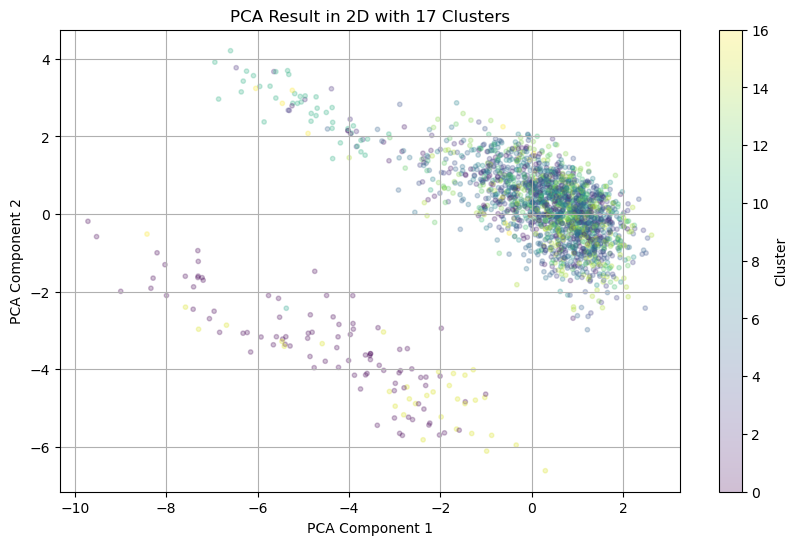

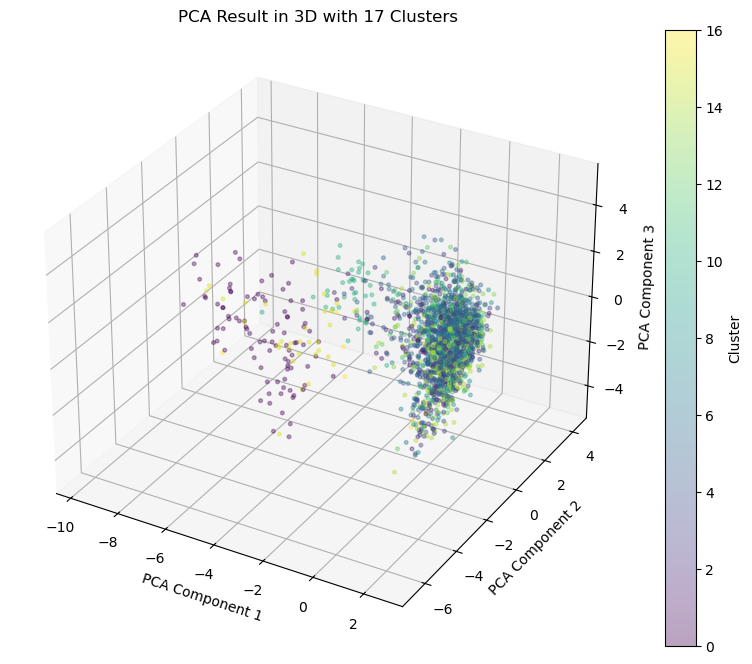

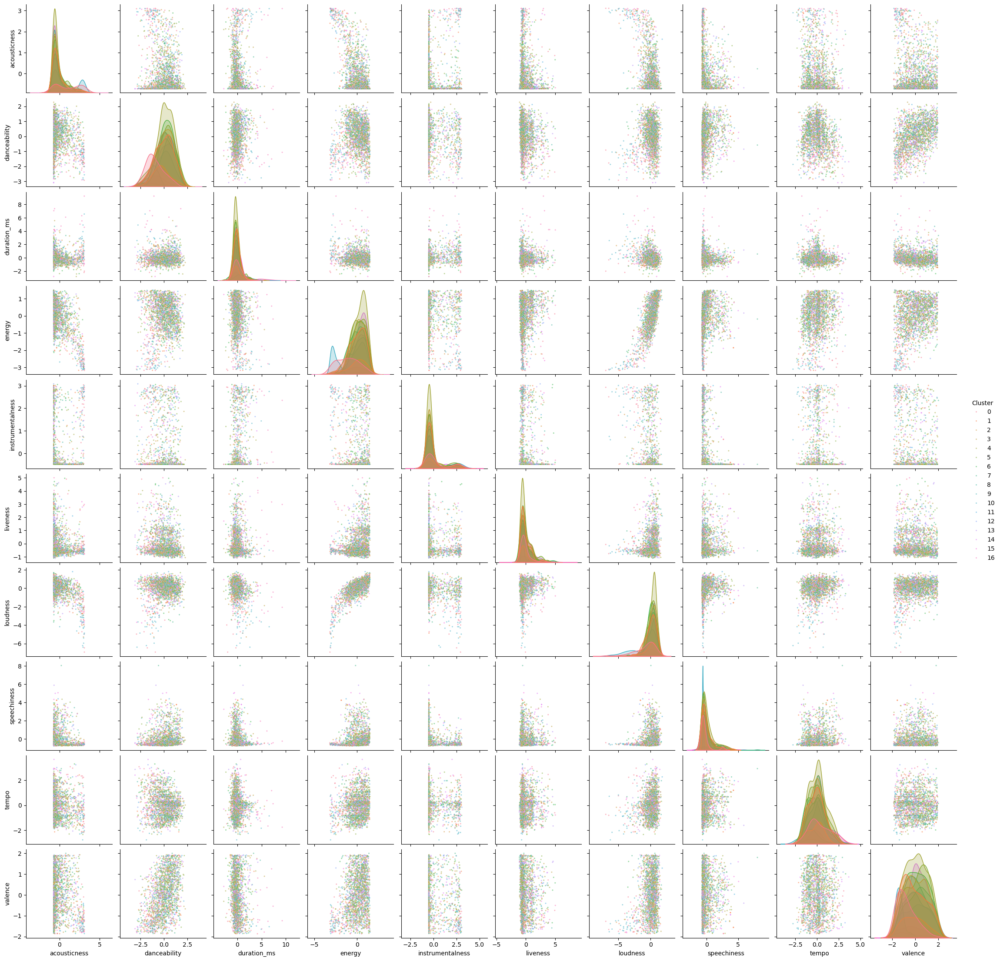

In [28]:
clusters = 17
# Perform hierarchical clustering
df_hierarchical = hierarchical_clustering(df_scaled, n_clusters=clusters)
print("Hierarchical Clustering Result:")
display(df_hierarchical.head())

# Visualize clusters in 2D and 3D for hierarchical clustering
visualize_clusters_2d(df_hierarchical, clusters, smaller_points=True)
visualize_clusters_3d(df_hierarchical, clusters, smaller_points=True)

# Pairplots of Hierarchical Clustering clusters
# Only pairplot for columns that don't start with 'time_signature_' or 'key_'
df_hierarchical_pairplot = df_hierarchical.loc[
    :, ~df_hierarchical.columns.str.startswith(("time_signature_", "key_"))
]

sns.pairplot(
    df_hierarchical_pairplot,
    hue="Cluster",
    palette=sns.color_palette("husl", n_colors=clusters),
    plot_kws={"s": 5, "alpha": 0.5},
    height=2.25,
)

In [29]:
# Silhouette Score for Hierarchical Clustering
silhouette_avg = silhouette_score(df_scaled, df_hierarchical["Cluster"])
print(
    f"Silhouette Score for Hierarchical Clustering: {round(silhouette_avg, 4)}"
)

# Davies-Bouldin Index for Hierarchical Clustering
db_index = davies_bouldin_score(df_scaled, df_hierarchical["Cluster"])
print(
    f"Davies-Bouldin Index for Hierarchical Clustering: {round(db_index, 4)}"
)

Silhouette Score for Hierarchical Clustering: 0.3522
Davies-Bouldin Index for Hierarchical Clustering: 1.112


Again, these cluster graphs and scores look decent. Now, let's compare the cluster assignments from both algorithms.

In [30]:
# Compare cluster assignments between K-Means and Hierarchical Clustering with NMI (No ARI because different number of clusters)


def compare_cluster_assignments(df_kmeans, df_hierarchical):
    ari = adjusted_rand_score(df_kmeans["Cluster"], df_hierarchical["Cluster"])
    nmi = normalized_mutual_info_score(
        df_kmeans["Cluster"], df_hierarchical["Cluster"]
    )
    return ari, nmi


ari, nmi = compare_cluster_assignments(df_kmeans, df_hierarchical)

print(f"Normalized Mutual Information (NMI): {nmi:.4f}")

Normalized Mutual Information (NMI): 0.9685


This score are very close to 1, demonstrating that the algorithms made similar assignments.

Overall, I think it is clear that there were effective clusterable patterns in this music dataset that might represent different genres or music types. Obviously, a labelled algorithm would be needed to quantify this fully. However, KMeans and Hierarchical Clustering seemed to segment the data effectively.

Outlier detection was a challenge in this dataset because there were so many rows: even after removing the one-hot-encoded key and time-signatures, the joint probability than any feature was outside its 1.5xIQR was high enough for the algorithm to discriminate most of the data as outliers. In the future, it might be beneficial to use a multivariate outlier detection algorithm. Feature scaling, on the other hand, was quite straightforward, using a standard scaling algorithm.

In this analysis, the Silhouette Score was crucial in finding the correct amount of clusters, which turned out to have a local maxima at 17, in addition to checking effectiveness. By contrast, I did not leverage DBI as a metric for the k hyperparameter, leaving it for final test validation.

This dataset was very different from the primary dataset, the credit card customers. Whereas the credit card dataset had an optimal cluster count of two, this one had an optimal cluster count of seventeen, steadily increasing in performance as k approached this value. This demonstrates how datasets can be multimodal in very different ways depending on the nature of the data. However, regardless of the dataset, and increased sample size will always enhance peformance and sometimes precision in segregating / differentiating clusters. Another thing notable was that in the primary dataset, the elbow of the clusters v linkage graph was quite different than the optimum of the clusters v silhouette score graph, whereas in this dataset, they coincided, which I found quite interesting. According to some of my research, silhouette score is a much more reliable measure than clusters v linkage for hierarchical clustering, but for Kmeans, the elbow graph is comparable in efficacy to the silhouette score graph (during which they simply excel in different domains).